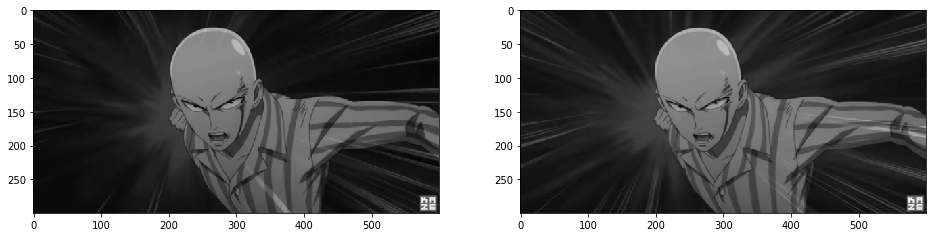

In [1]:
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pyplot as plt
import cv2 as cv
import numpy as np

im1 = imread('1.png')
im2 = imread('2.png')
im1 = rgb2gray(im1)
im2 = rgb2gray(im2)
fig, ax = plt.subplots(1, 2, figsize=(16, 24))
ax[0].imshow(im1, cmap='gray')
ax[1].imshow(im2, cmap='gray')

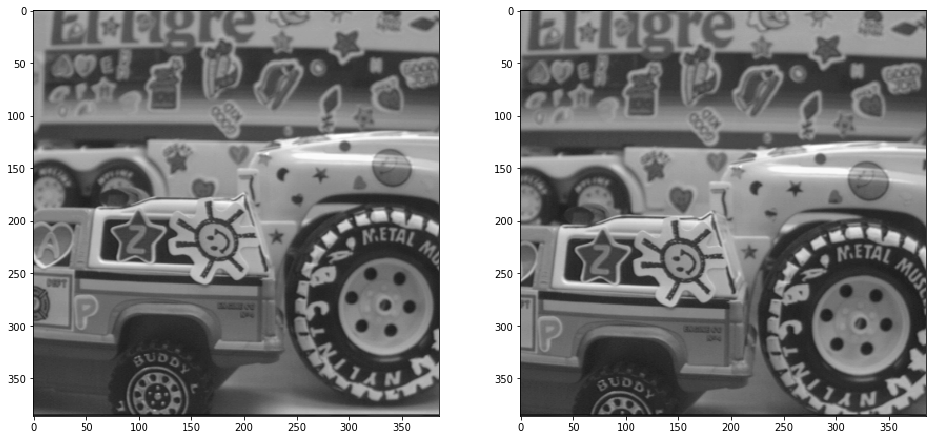

In [2]:
trucka = imread('trucka.bmp')
truckb = imread('truckb.bmp')
trucka = rgb2gray(trucka)
truckb = rgb2gray(truckb)
fig, ax = plt.subplots(1, 2, figsize=(16, 24))
ax[0].imshow(trucka, cmap='gray')
ax[1].imshow(truckb, cmap='gray')

In [3]:
def get_smoothness(row_index, col_index, motion_field):
    h, w = motion_field[0].shape
    d = np.array([motion_field[:, row_index, col_index]]).reshape(1, 2)
    if row_index > 0 and row_index < h - 1 and col_index > 0 and col_index < w - 1:
        dy0 = np.array([motion_field[:, row_index - 1, col_index - 1]]).reshape(1, 2)
        dy1 = np.array([motion_field[:, row_index - 1, col_index]]).reshape(1, 2)
        dy2 = np.array([motion_field[:, row_index - 1, col_index + 1]]).reshape(1, 2)
        dy3 = np.array([motion_field[:, row_index, col_index - 1]]).reshape(1, 2)
        dy4 = np.array([motion_field[:, row_index, col_index + 1]]).reshape(1, 2)
        dy5 = np.array([motion_field[:, row_index + 1, col_index - 1]]).reshape(1, 2)
        dy6 = np.array([motion_field[:, row_index + 1, col_index]]).reshape(1, 2)
        dy7 = np.array([motion_field[:, row_index + 1, col_index + 1]]).reshape(1, 2)
        dy = np.concatenate([dy0, dy1, dy2, dy3, dy4, dy5, dy6, dy7], axis=0)
        dx = np.repeat(d, 8, axis=0)
    elif row_index > 0 and row_index < h - 1 and col_index == 0:
        dy0 = np.array([motion_field[:, row_index - 1, col_index]]).reshape(1, 2)
        dy1 = np.array([motion_field[:, row_index - 1, col_index + 1]]).reshape(1, 2)
        dy2 = np.array([motion_field[:, row_index, col_index + 1]]).reshape(1, 2)
        dy3 = np.array([motion_field[:, row_index + 1, col_index]]).reshape(1, 2)
        dy4 = np.array([motion_field[:, row_index + 1, col_index + 1]]).reshape(1, 2)
        dy = np.concatenate([dy0, dy1, dy2, dy3, dy4], axis=0)
        dx = np.repeat(d, 5, axis=0)
    elif row_index > 0 and row_index < h - 1 and col_index == w - 1:
        dy0 = np.array([motion_field[:, row_index - 1, col_index - 1]]).reshape(1, 2)
        dy1 = np.array([motion_field[:, row_index - 1, col_index]]).reshape(1, 2)
        dy2 = np.array([motion_field[:, row_index, col_index - 1]]).reshape(1, 2)
        dy3 = np.array([motion_field[:, row_index + 1, col_index - 1]]).reshape(1, 2)
        dy4 = np.array([motion_field[:, row_index + 1, col_index]]).reshape(1, 2)
        dy = np.concatenate([dy0, dy1, dy2, dy3, dy4], axis=0)
        dx = np.repeat(d, 5, axis=0)
    elif col_index > 0 and col_index < w - 1 and row_index == 0:
        dy0 = np.array([motion_field[:, row_index, col_index - 1]]).reshape(1, 2)
        dy1 = np.array([motion_field[:, row_index, col_index + 1]]).reshape(1, 2)
        dy2 = np.array([motion_field[:, row_index + 1, col_index - 1]]).reshape(1, 2)
        dy3 = np.array([motion_field[:, row_index + 1, col_index]]).reshape(1, 2)
        dy4 = np.array([motion_field[:, row_index + 1, col_index + 1]]).reshape(1, 2)
        dy = np.concatenate([dy0, dy1, dy2, dy3, dy4], axis=0)
        dx = np.repeat(d, 5, axis=0)
    elif col_index > 0 and col_index < w - 1 and row_index == h - 1:
        dy0 = np.array([motion_field[:, row_index - 1, col_index - 1]]).reshape(1, 2)
        dy1 = np.array([motion_field[:, row_index - 1, col_index]]).reshape(1, 2)
        dy2 = np.array([motion_field[:, row_index - 1, col_index + 1]]).reshape(1, 2)
        dy3 = np.array([motion_field[:, row_index, col_index - 1]]).reshape(1, 2)
        dy4 = np.array([motion_field[:, row_index, col_index + 1]]).reshape(1, 2)
        dy = np.concatenate([dy0, dy1, dy2, dy3, dy4], axis=0)
        dx = np.repeat(d, 5, axis=0)
    elif col_index == 0 and row_index == 0:
        dy0 = np.array([motion_field[:, row_index, col_index + 1]]).reshape(1, 2)
        dy1 = np.array([motion_field[:, row_index + 1, col_index]]).reshape(1, 2)
        dy2 = np.array([motion_field[:, row_index + 1, col_index + 1]]).reshape(1, 2)
        dy = np.concatenate([dy0, dy1, dy2], axis=0)
        dx = np.repeat(d, 3, axis=0)
    elif col_index == w - 1 and row_index == h - 1:
        dy0 = np.array([motion_field[:, row_index - 1, col_index - 1]]).reshape(1, 2)
        dy1 = np.array([motion_field[:, row_index - 1, col_index]]).reshape(1, 2)
        dy2 = np.array([motion_field[:, row_index, col_index - 1]]).reshape(1, 2)
        dy = np.concatenate([dy0, dy1, dy2], axis=0)
        dx = np.repeat(d, 3, axis=0)

    return np.linalg.norm(np.array(dx, dtype=np.float32) - np.array(dy, dtype=np.float32), ord=2)


In [4]:
def EBMA(current_frame, reference_frame, block_size, search_range, alpha):

    h, w = current_frame.shape
    motion_field = np.empty((2, (h // block_size + 1), (w // block_size + 1)), dtype=np.int16)

    for row in range(0, h, block_size):
        for col in range(0, w, block_size):
            
            min_metric = np.inf
            current_block = current_frame[row:row + block_size, col:col + block_size]

            row_min = max(0, row - search_range)
            row_max = min(row + block_size + search_range, h)
            col_min = max(0, col - search_range)
            col_max = min(w, col + block_size + search_range)

            for row_search in range(row_min, row_max - current_block.shape[0]):
                for col_search in range(col_min, col_max - current_block.shape[1]):

                    search_block = reference_frame[row_search:row_search + current_block.shape[0], col_search:col_search + current_block.shape[1]]
                    assert search_block.shape == current_block.shape

                    block_metric = np.linalg.norm(np.array(search_block, dtype=np.float32) - np.array(current_block, dtype=np.float32), ord=1)
                    if block_metric < min_metric:
                        min_metric = block_metric
                        dy = int(row_search - row)
                        dx = int(col_search - col)

            motion_field[0, row // block_size, col // block_size] = dx
            motion_field[1, row // block_size, col // block_size] = dy

    if alpha > 0:
        for row in range(0, h, block_size):
            for col in range(0, w, block_size):

                min_metric = np.inf
                current_block = current_frame[row:row + block_size, col:col + block_size]

                row_min = max(0, row - search_range)
                row_max = min(row + block_size + search_range, h)
                col_min = max(0, col - search_range)
                col_max = min(w, col + block_size + search_range)

                for row_search in range(row_min, row_max - current_block.shape[0]):
                    for col_search in range(col_min, col_max - current_block.shape[1]):

                        search_block = reference_frame[row_search:row_search + current_block.shape[0], col_search:col_search + current_block.shape[1]]
                        assert search_block.shape == current_block.shape

                        block_metric = np.linalg.norm(np.array(search_block, dtype=np.float32) - np.array(current_block, dtype=np.float32), ord=1)
                        smoothness_metric = get_smoothness(row_search // block_size, col_search // block_size, motion_field)
                        
                        if block_metric + alpha * smoothness_metric < min_metric:
                            min_metric = block_metric
                            dy = row_search - row
                            dx = col_search - col

                motion_field[0, row // block_size, col // block_size] = dx
                motion_field[1, row // block_size, col // block_size] = dy
    
    return motion_field

In [5]:
def display(img, motion_field, block_size, size=(10, 10), sample=-1):
    fig, ax = plt.subplots(1, 1, figsize=size)
    ax.imshow(img, cmap='gray')
    X, Y = np.meshgrid(np.arange(0, img.shape[1], block_size), np.arange(0, img.shape[0], block_size))
    if sample == -1:
        ax.quiver(X, Y, motion_field[0], -motion_field[1], color='red')
    else:
        ax.quiver(X[::sample, ::sample], Y[::sample, ::sample], motion_field[0, ::sample, ::sample], -motion_field[1, ::sample, ::sample], color='red')
    ax.axis('off')

# 1)
## A)

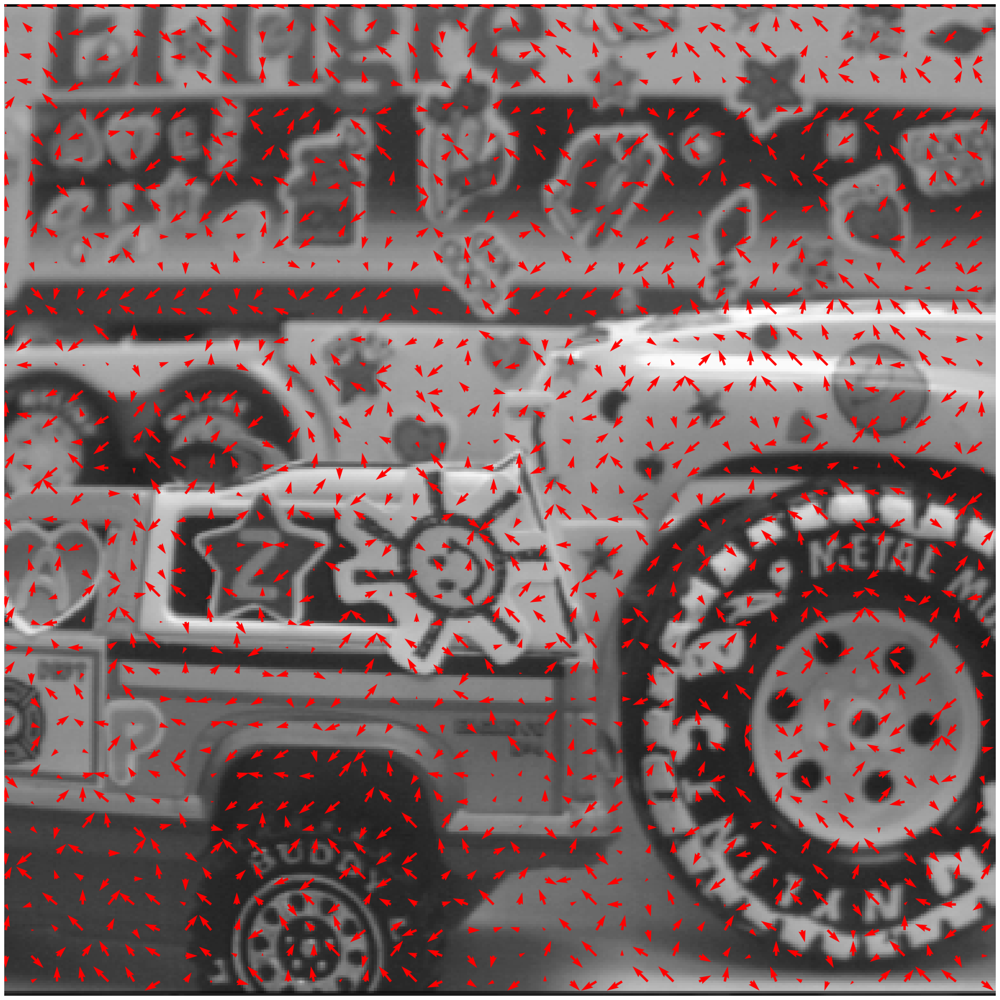

In [38]:
motion_field = EBMA(trucka, truckb, 1, 5, alpha=0)
display(trucka, motion_field, 1, (30, 30), 10)

## B)

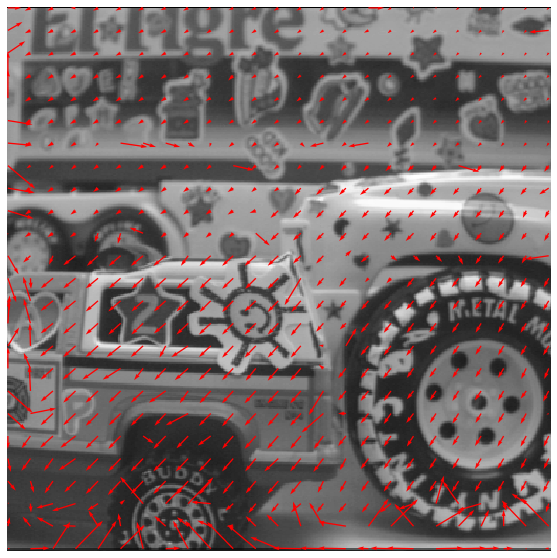

In [39]:
motion_field = EBMA(trucka, truckb, 16, 50, alpha=0)
display(trucka, motion_field, 16)

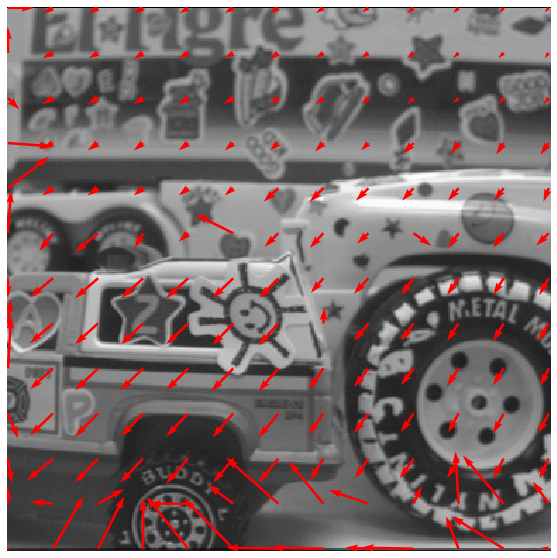

In [40]:
motion_field = EBMA(trucka, truckb, 32, 50, alpha=0)
display(trucka, motion_field, 32)

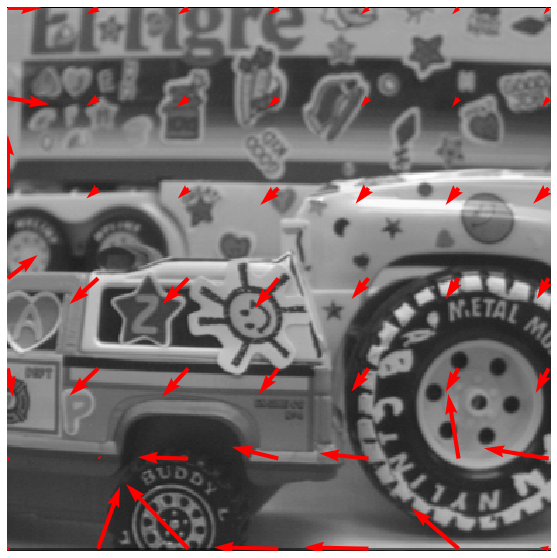

In [41]:
motion_field = EBMA(trucka, truckb, 64, 50, alpha=0)

display(trucka, motion_field, 64)

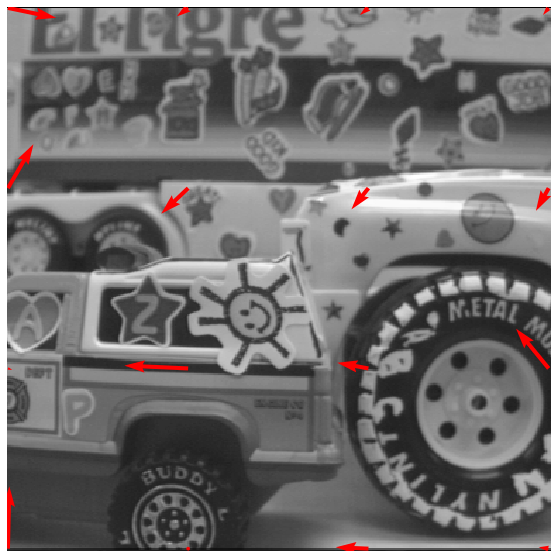

In [42]:
motion_field = EBMA(trucka, truckb, 128, 50, alpha=0)

display(trucka, motion_field, 128)

## C)

Les vecteurs de mouvement pointent vers la zone vers laquelle va se deplacer le bloc dans l'image F2. On a représenté ici l'image F1.

Il semble que l'utilisation d'un méthode d'estimation de mouvement 'pixel wise' donne un résultat très bruité avec des pixels proches ayant un mouvement contraire. A l'inverse, l'utilisation de blocs permet naturellement de régulariser de manière à avoir un champ plus uniforme et lisse. Plus les blocs sont gros et plus le rendu est lisse.

Par ailleurs, on a un problème sur certains bords des images. Cela est lié au fait que certains blocs dans l'image F1 ne sont plus présent dans l'image F2. Par conséquent, le matching block trouvé pour ces blocs prochent des bords de l'image (ici bord gauche et bord du bas de l'image) est très peu précis voir incohérent.

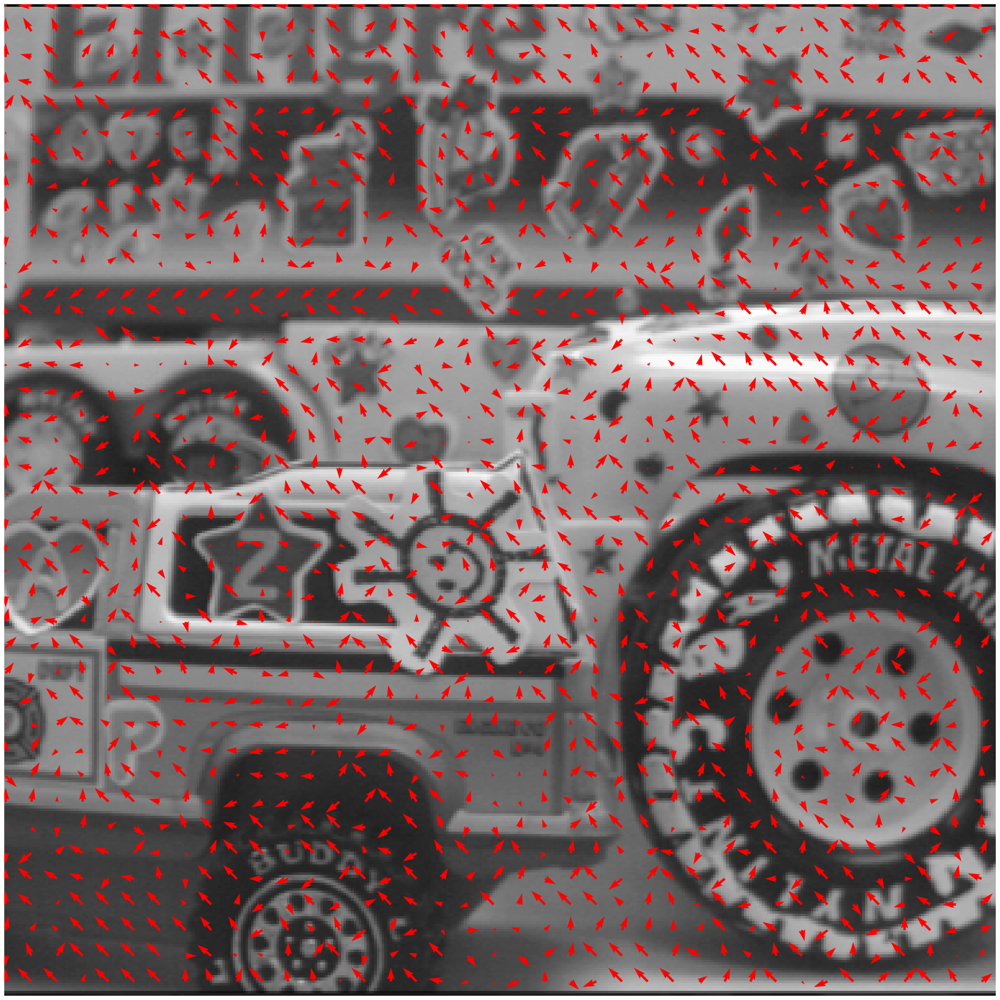

In [43]:
motion_field = EBMA(trucka, truckb, 1, 5, alpha=1)

display(trucka, motion_field, 1, (30, 30), 10)

## D)
Le champ de vecteur obtenu après regularisation reste assez éloigné du flow optique. En effet, même si l'on constate que cela est plus lisse, les mouvements sont toujours souvent en sens contraire pour des zones assez proche ce qui ne représente pas bien la difference que l'on semble percevoir entre les deux images. En faisant tourner l'algorithme avec un alpha plus grand on obtiendrait des mouvements plus uniformes et lisses (mais le temps d'execution est trop long).

# 2)
## a)

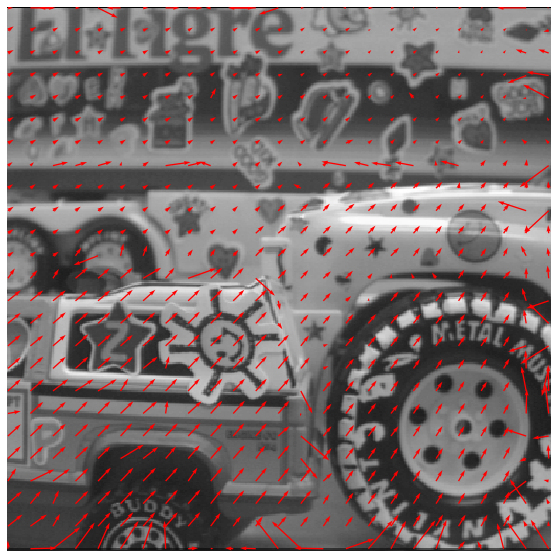

In [6]:
block_size = 16
motion_field = EBMA(truckb, trucka, block_size, 50, alpha=0)

display(truckb, motion_field, block_size)

## b)
Les vecteurs de mouvement pointent ici vers la zone où se trouvait le bloc dans la frame precedente F1. C'est à dire dans le sens opposé au vecteurs de mouvements dans la partie 1). On a représenté ici l'image F2. Dans la partie 1 les vecteurs de mouvement pointaient vers la position du bloc au temps t2 c'est à dire dans la frame F2. On avait affiché la frame F1 dans la partie

On constate que les problèmes que l'on avait sur les bords de l'image sont toujours présent mais concernent cette fois ci le bord droit et le bord du bas de l'image. Cela résulte du fait que les blocs situés sur ces bord de l'image F2 n'étaient pas présent dans la frame F1. Donc l'algorithme a du mal à trouver un bloc correspondant dans la frame F1 ce qui est normal. Par conséquent la direction des vecteurs de mouvement sur certains bords de l'image ont tendance à être illogique (il faut bien que l'algorithme trouve un matching bloc quand même).

## c)

In [7]:
def predict_frame(F1, motion_field, block_size):
    h, w = F1.shape
    predicted_frame = np.zeros(F1.shape)
    for row in range(0, h, block_size):
        for col in range(0, w, block_size):
            dy = motion_field[1, row // block_size, col // block_size]
            dx = motion_field[0, row // block_size, col // block_size]
            block_size_x = min(w, col + block_size) - col
            block_size_y = min(h, row + block_size) - row
            predicted_frame[row:row + block_size, col:col + block_size] = F1[row + dy:row + dy + block_size, col + dx:col + dx + block_size][:block_size_y, :block_size_x]
    return predicted_frame

Quand la taille du bloc n'est pas un diviseur de la taille de l'image en x ou y, on trouve des pixels noirs sur le bord de l'image. Pour éviter cet artefact, on a tronqué la taille du bloc seulement pour les blocs près des bords de l'image (dernière colonne et dernière ligne de blocs). La nouvelle valeur de ces blocs est égale à la valeur minimum entre la taille d'un bloc et l'espace séparant le dernier bloc du bord de l'image.

(-0.5, 385.5, 385.5, -0.5)

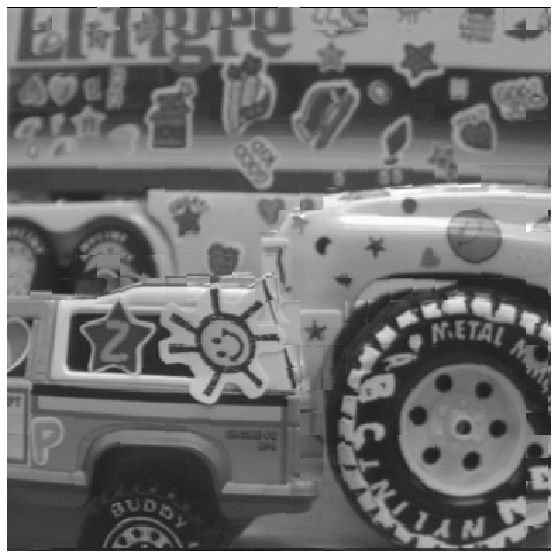

In [8]:
motion_compensated_frame = predict_frame(trucka, motion_field, block_size)
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
ax.imshow(motion_compensated_frame, cmap='gray')
ax.axis('off')

## D)

Les trois données classiques dont on a besoin pour reconstruire la frame de façon parfaite sont:  

    - La frame de reference F1  

    - Les motions vectors  
    
    - La residual frame resultant de la différence entre F2 et l'image prédite par la phase de motion estimation

Pour reconstruire de façon parfaite on va prédire la frame F2 à partir de F1 et les motions vectors (motion compensated frame). Ensuite, en ajoutant cette frame de prediction (qui n'est pas parfaite) à la residual frame on obtient F2 de façon parfaite.

(-0.5, 385.5, 385.5, -0.5)

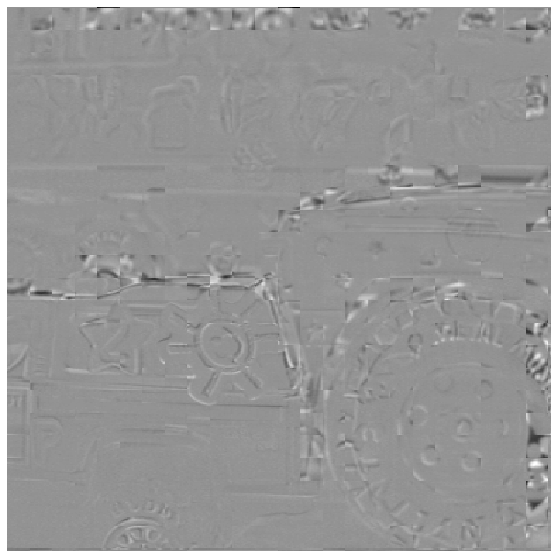

In [10]:
residual_frame = truckb - motion_compensated_frame
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(residual_frame, cmap='gray')
ax.axis('off')

## E)

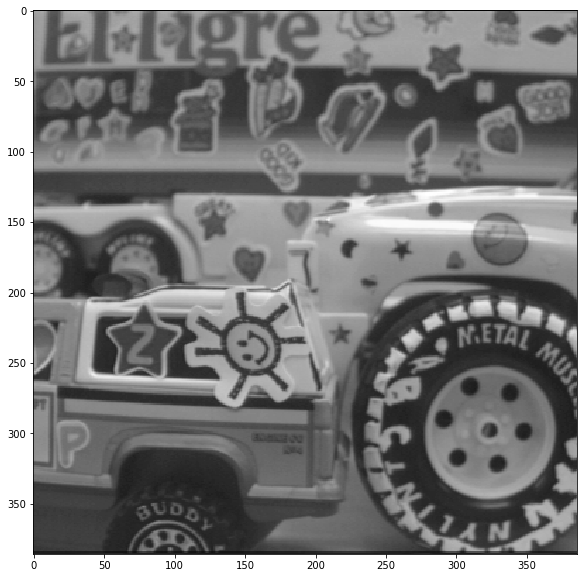

In [52]:
test = motion_compensated_frame + residual_frame
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(test, cmap='gray')

# 3)
## A)
On va chercher à coder la residual frame en utilisant, par exemple, la DCT puis quantisation puis RLE et Huffman (jpeg). Plus l'erreur de reconstruction est faible et moins la residual frame va contenir d'information et donc plus il sera facile de compresser. 

## B)
Pour nos test, on va utiliser le format jpeg avec differentes qualités pour analyser le compromis qualité/taille du fichier. On utilise openCV pour sauvegarder la residual frame avec différents niveaux de qualité. Le but est ici de réduire la taille de la frame d'erreur car c'est une image qui contient moins d'information donc son alteration sera moins visible. Le format jpeg est un processus de compression 'lossy' donc avec perte. Donc même en fixant une qualité de 100 dans la fonction de sauvegrde d'opencv on observe que l'image sauvegardé est différente de l'image d'entrée (avec np.unique par exemple). Pour eviter qu'opencv ne convertisse notre image en valeur absolue au moment de la sauvegarde, on va réechelonner les valeurs des pixels d'abord entre 0 et 255 puis, après avoir chargé l'image jpeg on effectue la transformée inverse pour retrouver la même échelle de valeur que dans la residual frame de départ. De cette manière, on sera capable d'ajouter la residual frame compressée à la 'motion compensated frame' de manière à avoir une image compréssée.

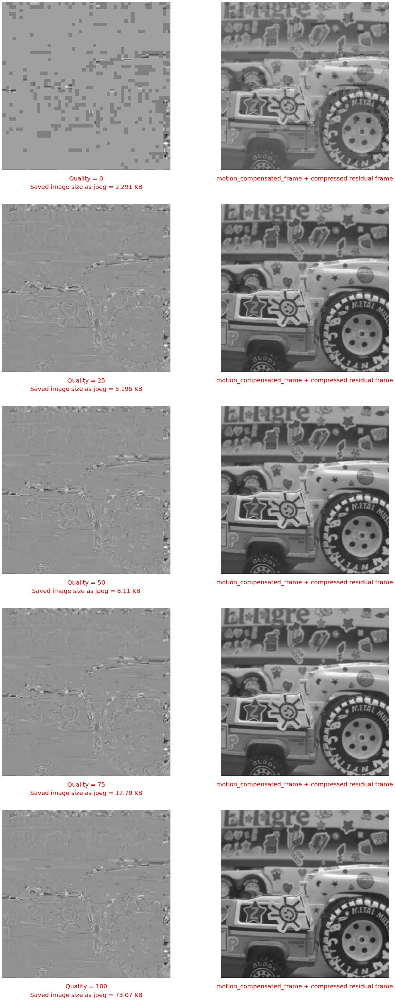

In [86]:
import os
import cv2 as cv

min_value = residual_frame.min()
max_value = residual_frame.max()
residual_frame_height_bits = (residual_frame - min_value) * (255 / (max_value - min_value))
qualities=[0, 25, 50, 75, 100]
fig, ax = plt.subplots(5, 2, figsize=(24, 60))
for i, quality in zip(range(5), qualities):
    cv.imwrite('residual_frame.jpg', residual_frame_height_bits, [int(cv.IMWRITE_JPEG_QUALITY), quality])
    test = cv.imread('residual_frame.jpg', cv.IMREAD_GRAYSCALE).astype(np.float64)
    test_after = ((test * (max_value - min_value)) / 255) + min_value
    ax[i, 0].imshow(test_after, cmap='gray')
    ax[i, 0].axis('off')
    ax[i, 0].text(0.5, -0.05, 'Quality = {}'.format(quality), horizontalalignment='center', verticalalignment='center', transform=ax[i, 0].transAxes, fontsize=20, color='red')
    ax[i, 0].text(0.5, -0.1, 'Saved image size as jpeg = {} KB'.format(os.stat('residual_frame.jpg').st_size / 1000), horizontalalignment='center', verticalalignment='center', transform=ax[i, 0].transAxes, fontsize=20, color='red')
    ax[i, 1].imshow(test_after + motion_compensated_frame, cmap='gray')
    ax[i, 1].axis('off')
    ax[i, 1].text(0.5, -0.05, 'motion_compensated_frame + compressed residual frame', horizontalalignment='center', verticalalignment='center', transform=ax[i, 1].transAxes, fontsize=20, color='red')

On constate qu'en fixant la qualité à 75, on divise déjà la taille de la residual frame par presque 6. Ensuite si on ajoute cette residual frame compressée à la motion compensated frame obtenu à la question 2)c) on obtient une image correcte. On constate que l'image la plus en haut de la colonne de gauche est assez dégradée. La différence est notable par rapport à l'image la plus en bas. Cependant avec une qualité de 25 et une qualité de 100, la différence est beaucoup moins perceptible et on a pourtant réduit la taille de la residual frame par 14.

## C)

Dans l'approche mesh-based, le deplacement de chaque point d'un polygone se calcul comme une interpolation des déplacements des n nodes du polygone. 

Dans le cas d'un polygone à trois nodes, le kernel représente une fonction affine. Dans le cas d'un polygone à quatre nodes, le kernel est une fonction bilinéaire. Dans le cas d'un polygone à un seul node (ce que nous avons traité plus haut dans ce tp), le kernel représente une translation.  

Du point de vue de la minimisation, on va toujours chercher à minimiser la DFD mais le calcul de cette DFD sera différent. En particulier le calcul du matching block dans la frame de reference va se faire en multipliant les motions vectors à chaque node du polygone par leur kernel d'interpolation correspondant. Ce kernel correspond à la contribution d'un node du polygone pour obtenir le motion vector.  

Par ailleurs, ce kernel d'interpolation doit satisfaire certaines contraintes pour s'assurer de la continuité entre les blocs:  
- Le kernel d'un node d'un polygone doit être compris entre 0 et 1.  
- La somme des kernels d'un polygone doit être égal à 1.  

En utilisant une approche mesh-based, on aurait eu moins de discontinuités à la frontière entre les blocs et globalement l'image reconstruite aurait été plus lisse. Le motion field aurait été moins chaotique.